In [1]:
import json
from typing import List, Tuple
import contextlib
import io

import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
from tqdm.notebook import tqdm
from rich import print
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
from PIL import Image

from src.blip_modules.blip_text_encoder import BLIPTextEncoder
from src.blip_modules.blip_img_encoder import BLIPImgEncoder
from src.data_utils import CIRRDataset, targetpad_transform
from src.utils import extract_index_features, device, extract_index_features_with_text_captions
from src.validate import generate_cirr_val_predictions

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 1: Modify the function for calculation in different alpha values</div>

# <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform alpha search for the best alpha value after the search and index were encoded</div>

In [2]:
@contextlib.contextmanager
def suppress_output():
    with io.StringIO() as buf, contextlib.redirect_stdout(buf), contextlib.redirect_stderr(buf):
        yield

# Define the decorator to suppress output of the function and any functions it calls
def suppress_function_output(func):
    def wrapper(*args, **kwargs):
        with suppress_output():
            return func(*args, **kwargs)
    return wrapper

In [3]:
def compute_cirr_val_metrics_text_image_modified(
    relative_val_dataset: CIRRDataset,
    blip_text_encoder: torch.nn.Module,
    multiple_text_index_features: List[torch.tensor],
    multiple_text_index_names: List[List[str]],
    image_index_features: torch.tensor,
    image_index_names: List[str],
    combining_function: callable
) -> pd.DataFrame:
    """
    Compute validation metrics on CIRR dataset combining text and image distances.

    :param relative_val_dataset: CIRR validation dataset in relative mode
    :param blip_text_encoder: BLIP model
    :param multiple_text_index_features: validation index features from text
    :param multiple_text_index_names: validation index names from text
    :param image_index_features: validation image index features
    :param image_index_names: validation image index names
    :param combining_function: function that combines features
    :return: the computed validation metrics
    """
    all_text_distances = []
    results = []
    alphas = np.arange(0, 1.05, 0.05)
    reference_names = None
    target_names = None
    group_members = None

    # Compute distances for individual text features
    for text_features, text_names in zip(multiple_text_index_features, multiple_text_index_names):
        # Generate text predictions and normalize features
        predicted_text_features, reference_names, target_names, group_members = generate_cirr_val_predictions(
            blip_text_encoder,
            relative_val_dataset,
            combining_function,
            text_names,
            text_features
        )
        # Normalize features
        text_features = F.normalize(text_features, dim=-1)
        predicted_text_features = F.normalize(predicted_text_features, dim=-1)

        # Compute cosine similarity and convert to distance
        cosine_similarities = torch.mm(predicted_text_features, text_features.T)
        distances = 1 - cosine_similarities
        all_text_distances.append(distances)

    # Normalize and compute distances for image features if available
    if image_index_features is not None and len(image_index_features) > 0:
        predicted_image_features, _, _, _ = generate_cirr_val_predictions(
            blip_text_encoder,
            relative_val_dataset,
            combining_function,
            image_index_names,
            image_index_features
        )

        # Normalize and compute distances
        image_index_features = F.normalize(image_index_features, dim=-1).float()
        image_distances = 1 - predicted_image_features @ image_index_features.T
    else:
        image_distances = torch.zeros_like(all_text_distances[0])

    # Merge text distances
    merged_text_distances = torch.mean(torch.stack(all_text_distances), dim=0)

    # Iterating over alpha values
    for alpha in alphas:
        merged_distances = alpha * merged_text_distances + (1 - alpha) * image_distances
        # Sort the results
        sorted_indices = torch.argsort(merged_distances, dim=-1).cpu()
        sorted_index_names = np.array(
            image_index_names if image_index_names else multiple_text_index_names[0]
        )[sorted_indices]
    
        # Delete the reference image from the results
        reference_mask = torch.tensor(
            sorted_index_names != np.repeat(
                np.array(reference_names),
                len(image_index_names)
            ).reshape(len(target_names), -1)
        )
    
        sorted_index_names = sorted_index_names[reference_mask].reshape(
            sorted_index_names.shape[0],
            sorted_index_names.shape[1] - 1
        )
    
        # Compute the ground-truth labels with respect to the predictions
        labels = torch.tensor(
            sorted_index_names == np.repeat(
                np.array(target_names),
                len(sorted_index_names[0])
            ).reshape(len(target_names), -1)
        )
        
        # Compute the subset predictions and ground-truth labels
        group_members = np.array(group_members)
        group_mask = (sorted_index_names[..., None] == group_members[:, None, :]).sum(-1).astype(bool)
        group_labels = labels[group_mask].reshape(labels.shape[0], -1)

        assert torch.equal(torch.sum(labels, dim=-1).int(), torch.ones(len(target_names)).int())
        assert torch.equal(torch.sum(group_labels, dim=-1).int(), torch.ones(len(target_names)).int())
    
        # Compute the metrics
        recall_at1 = (torch.sum(labels[:, :1]) / len(labels)).item() * 100
        recall_at5 = (torch.sum(labels[:, :5]) / len(labels)).item() * 100
        recall_at10 = (torch.sum(labels[:, :10]) / len(labels)).item() * 100
        recall_at50 = (torch.sum(labels[:, :50]) / len(labels)).item() * 100
        group_recall_at1 = (torch.sum(group_labels[:, :1]) / len(group_labels)).item() * 100
        group_recall_at2 = (torch.sum(group_labels[:, :2]) / len(group_labels)).item() * 100
        group_recall_at3 = (torch.sum(group_labels[:, :3]) / len(group_labels)).item() * 100
        
        results.append({
            "alpha": alpha,
            "recall_at1": recall_at1,
            "recall_at5": recall_at5,
            "recall_at10": recall_at10,
            "recall_at50": recall_at50,
            "group_recall_at1": group_recall_at1,
            "group_recall_at2": group_recall_at2,
            "group_recall_at3": group_recall_at3,
        })

    return pd.DataFrame(results)

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">The only diffence is remove alpha parameter from the function</div>

In [4]:
cache = {}

@suppress_function_output
def cirr_val_retrieval_text_image_modified(
    combining_function: callable,
    blip_text_encoder: torch.nn.Module,
    blip_img_encoder: torch.nn.Module,
    text_captions: List[dict],
    preprocess: callable):
    """
    Perform retrieval on CIRR validation set computing the metrics. To combine the features, the `combining_function` is used
    :param combining_function:function which takes as input (image_features, text_features) and outputs the combined features
    :param blip_text_encoder: BLIP text model
    :param blip_img_encoder: BLIP image model
    :param text_captions: text captions for the CIRR dataset
    :param preprocess: preprocess pipeline
    """
    global cache
    
    blip_text_encoder = blip_text_encoder.float().eval()
    blip_img_encoder = blip_img_encoder.float().eval()

    if 'index_cache' not in cache:
        # Define the validation datasets and extract the index features
        classic_val_dataset = CIRRDataset('val', 'classic', preprocess)
    
        multiple_index_features, multiple_index_names = [], []
    
        for i in range(3):
            index_features, index_names, _ = extract_index_features_with_text_captions(
                classic_val_dataset,
                blip_text_encoder,
                text_captions,
                i + 1
            )
            multiple_index_features.append(index_features)
            multiple_index_names.append(index_names)
    
        image_index_features, image_index_names = extract_index_features(classic_val_dataset, blip_img_encoder)
        
        cache['index_cache'] = {
            "multiple_index_features": multiple_index_features,
            "multiple_index_names": multiple_index_names,
            "image_index_features": image_index_features,
            "image_index_names": image_index_names,
        }
    else:
        multiple_index_features = cache['index_cache']['multiple_index_features']
        multiple_index_names = cache['index_cache']['multiple_index_names']
        image_index_features = cache['index_cache']['image_index_features']
        image_index_names = cache['index_cache']['image_index_names']

    relative_val_dataset = CIRRDataset('val', 'relative', preprocess)

    return compute_cirr_val_metrics_text_image_modified(
        relative_val_dataset,
        blip_text_encoder,
        multiple_index_features,
        multiple_index_names,
        image_index_features,
        image_index_names,
        combining_function
    )

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 2: Load the BLIP model and the Combiner</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Same concept as script version here</div>

In [5]:
BLIP_PRETRAINED_PATH = '../models/model_base.pth'
MED_CONFIG_PATH = 'blip_modules/med_config.json'

In [6]:
blip_text_encoder = BLIPTextEncoder(
    BLIP_PRETRAINED_PATH, 
    MED_CONFIG_PATH,
    use_pretrained_proj_layer=True
)

blip_text_encoder = blip_text_encoder.to(device)
print("blip text encoder loaded.")
blip_text_encoder.eval()

load checkpoint from ../models/model_base.pth for text_encoder.
load checkpoint from ../models/model_base.pth for text_proj.


blip text encoder loaded.

BLIPTextEncoder(
  (text_encoder): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30524, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
              (dropout): Drop

In [7]:
blip_img_encoder = BLIPImgEncoder(BLIP_PRETRAINED_PATH)
blip_img_encoder = blip_img_encoder.to(device)
print("blip img encoder loaded.")
blip_img_encoder.eval()

reshape position embedding from 196 to 576
load checkpoint from ../models/model_base.pth for visual_encoder.
load checkpoint from ../models/model_base.pth for vision_proj.


blip img encoder loaded.

BLIPImgEncoder(
  (visual_encoder): VisionTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      (norm): Identity()
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (blocks): ModuleList(
      (0-11): 12 x Block(
        (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (attn_drop): Dropout(p=0.0, inplace=False)
          (proj): Linear(in_features=768, out_features=768, bias=True)
          (proj_drop): Dropout(p=0.0, inplace=False)
        )
        (drop_path): Identity()
        (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): Mlp(
          (fc1): Linear(in_features=768, out_features=3072, bias=True)
          (act): GELU(approximate='none')
          (fc2): Linear(in_features=3072, out_features=768, bias=True)
          (drop): Dropout(p=0.0, inplace=False)
      

In [8]:
print('Target pad preprocess pipeline is used')
preprocess = targetpad_transform(1.25, 384)

Target pad preprocess pipeline is used

In [9]:
def element_wise_sum_original(image_features: torch.tensor, text_features: torch.tensor) -> torch.tensor:
    """
    Normalized element-wise sum of image features and text features
    :param image_features: non-normalized image features
    :param text_features: non-normalized text features
    :return: normalized element-wise sum of image and text features
    """
    return F.normalize(image_features + text_features, dim=-1)

In [10]:
combining_function_original = element_wise_sum_original

In [11]:
def element_wise_sum(image_features: torch.tensor, text_features: torch.tensor, beta=0.65) -> torch.tensor:
    """
    Normalized element-wise sum of image features and text features
    :param image_features: non-normalized image features
    :param text_features: non-normalized text features
    :param beta: weight for text features
    :return: normalized element-wise sum of image and text features
    """
    return F.normalize((1 - beta) * image_features + beta * text_features, dim=-1)

In [12]:
combining_function = lambda image_features, text_features: element_wise_sum(image_features, text_features, beta=0.65)

In [13]:
def get_combing_function_with_beta(beta: float):
    return lambda image_features, text_features: element_wise_sum(image_features, text_features, beta=beta)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 3: Perform retrieval on the CIRR dataset</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Load the addition text captions and perform retrieval on the CIRR dataset</div>

In [14]:
with open('../cirr_dataset/cirr_labeled_images_cir_cleaned.json', 'r') as f:
    text_captions = json.load(f)

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the function to convert the list of DataFrames to a single DataFrame with a pivot table structure</div>

In [15]:
def convert_to_pivot(
    data: List[pd.DataFrame]
) -> Tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    """
    Convert a list of DataFrames to a single DataFrame with a pivot table structure.
    :param data: list of DataFrames
    :return: a single DataFrame with a pivot table structure
    """
    concatenated_data = []
    betas = np.arange(0, 1.05, 0.05)

    # Concatenate dataframes for all betas and add beta_index, beta_df in enumerate(data):
    for beta_index, beta_df in enumerate(data):
        beta_df['beta'] = round(betas[beta_index], 2)  # Round to two decimal places
        concatenated_data.append(beta_df)

    # Create one dataframe per category
    category_df = pd.concat(concatenated_data, ignore_index=True)

    # Create pivot tables for 
    recall_at1 = category_df.pivot(index='alpha', columns='beta', values='recall_at1')
    recall_at5 = category_df.pivot(index='alpha', columns='beta', values='recall_at5')
    recall_at10 = category_df.pivot(index='alpha', columns='beta', values='recall_at10')
    recall_at50 = category_df.pivot(index='alpha', columns='beta', values='recall_at50')
    group_recall_at1 = category_df.pivot(index='alpha', columns='beta', values='group_recall_at1')
    group_recall_at2 = category_df.pivot(index='alpha', columns='beta', values='group_recall_at2')
    group_recall_at3 = category_df.pivot(index='alpha', columns='beta', values='group_recall_at3')

    return recall_at1, recall_at5, recall_at10, recall_at50, group_recall_at1, group_recall_at2, group_recall_at3

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval</div>

In [16]:
grid_search_betas = np.arange(0, 1.05, 0.05)
total_result: List[pd.DataFrame] = []

for beta in tqdm(grid_search_betas, desc="Grid Search Betas"):
    result = cirr_val_retrieval_text_image_modified(
        get_combing_function_with_beta(beta),
        blip_text_encoder,
        blip_img_encoder,
        text_captions,
        preprocess
    )
    
    total_result.append(result)

recall_at1, recall_at5, recall_at10, recall_at50, group_recall_at1, group_recall_at2, group_recall_at3 = convert_to_pivot(total_result)

Grid Search Betas:   0%|          | 0/21 [00:00<?, ?it/s]

In [17]:
display(recall_at1, recall_at5, recall_at10, recall_at50, group_recall_at1, group_recall_at2, group_recall_at3)

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,6.457786,6.481703,6.481703,6.481703,6.577374,6.649127,6.720880,6.792633,6.960057,7.175317,...,7.534083,7.629754,7.892849,8.466874,8.969146,9.973691,11.743602,15.570438,21.860799,19.492944
0.05,6.433868,6.433868,6.553456,6.673045,6.888304,6.912222,6.888304,7.055728,7.247070,7.438412,...,7.845013,7.940684,8.371203,8.993064,9.303994,10.284621,12.413298,16.742407,22.913179,20.353982
0.10,6.553456,6.720880,6.816551,6.960057,7.031810,7.055728,7.247070,7.390577,7.486247,7.749342,...,8.155943,8.395121,8.706051,9.375747,9.686678,10.978235,13.035159,17.555609,23.535040,21.334609
0.15,6.816551,6.912222,7.055728,7.175317,7.294905,7.438412,7.677589,7.773260,7.916766,8.132026,...,8.442956,8.777805,9.136570,9.614924,10.236786,11.791437,13.896197,18.847166,24.635255,22.004305
0.20,6.888304,6.983975,7.151400,7.414494,7.462329,7.581918,7.701506,7.868931,8.012437,8.155943,...,8.753887,8.993064,9.471418,10.021526,11.026070,12.532887,15.044248,19.875628,25.448456,22.650084
0.25,6.696963,6.888304,7.031810,7.151400,7.294905,7.581918,7.749342,7.940684,8.084191,8.251614,...,8.825640,9.327912,9.734514,10.643387,11.504425,13.441761,15.953121,20.856254,25.759387,23.008850
0.30,6.912222,6.983975,7.055728,7.247070,7.390577,7.486247,7.797178,8.012437,8.347286,8.538627,...,9.160488,9.758431,10.308538,11.217412,12.293710,14.254963,16.981584,21.932553,26.165989,23.128438
0.35,6.720880,6.888304,6.936140,7.103564,7.366659,7.486247,7.868931,8.060273,8.371203,8.610380,...,9.495336,10.045443,10.882564,11.815355,13.178666,15.187754,18.464482,22.889261,26.405168,23.415451
0.40,6.744798,6.960057,7.079646,7.175317,7.199235,7.653672,7.940684,8.251614,8.419038,8.873475,...,9.878019,10.475963,11.528342,12.580723,13.944033,16.240133,19.421192,23.248027,26.596507,23.487204


beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,23.511122,23.630710,23.726381,23.845969,24.013394,24.252571,24.419995,24.611337,24.898350,25.185362,...,25.878978,26.453000,27.218369,28.318584,29.657978,32.145420,36.665869,43.602008,49.724945,41.688591
0.05,23.654628,23.726381,23.917723,24.085148,24.300407,24.491748,24.850515,25.065774,25.472376,25.902894,...,26.524755,27.170533,28.007653,29.131788,31.093040,33.460894,37.981343,45.060989,50.968665,42.836642
0.10,24.085148,24.252571,24.443913,24.587420,24.874432,25.113609,25.281033,25.639799,26.022482,26.381248,...,27.218369,27.864146,28.940445,30.232003,32.145420,35.015547,39.392489,46.543890,52.044964,43.817270
0.15,24.467830,24.683090,24.946184,25.089690,25.400621,25.663716,25.926811,26.165989,26.692179,27.122697,...,28.031573,28.868693,29.825401,31.380051,33.628318,36.498445,40.660128,47.835445,52.834249,44.893566
0.20,24.730925,24.826597,25.017938,25.328869,25.807223,25.974646,26.596507,27.074862,27.457547,27.768478,...,28.749102,29.562306,30.829945,32.599857,34.991628,37.837839,42.430040,49.174839,53.647453,45.682850
0.25,24.826597,25.089690,25.352785,25.711551,26.142073,26.572591,27.027026,27.409711,27.696723,28.175077,...,29.490551,30.806026,32.121503,34.321934,36.283186,39.392489,44.056445,50.633818,53.934467,45.730686
0.30,24.946184,25.233197,25.472376,25.926811,26.357332,26.740015,27.218369,27.648887,28.366420,28.820857,...,30.853862,31.977996,33.556566,35.350394,37.598661,40.851471,45.515427,51.638365,53.647453,46.304712
0.35,25.137526,25.448456,25.735471,26.094237,26.524755,27.027026,27.624971,28.175077,29.012197,29.801482,...,31.714901,32.743362,34.680697,36.952883,39.320737,42.788807,47.046161,52.068883,53.312606,46.711314
0.40,25.137526,25.568047,25.950730,26.285577,26.955274,27.529299,28.079405,28.820857,29.514471,30.519015,...,32.743362,34.082755,35.828748,38.077015,40.851471,44.391295,48.122460,52.355897,53.193015,46.687394


beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,32.958624,33.078212,33.269551,33.365223,33.556566,33.795741,34.154508,34.656781,35.063383,35.661325,...,36.785457,37.718248,39.105478,40.779719,42.932314,46.137288,51.016504,57.091606,61.755562,53.097343
0.05,33.747908,33.795741,33.963168,34.250179,34.417602,34.848124,35.087299,35.517818,36.044008,36.785457,...,38.340110,39.225066,40.564460,42.310452,44.439128,47.907200,52.475482,59.028941,63.094956,54.293233
0.10,34.417602,34.656781,34.872040,34.991628,35.326478,35.804832,36.067927,36.522362,37.359482,38.148767,...,39.703420,40.612292,42.071274,43.410668,46.113369,49.605358,54.245394,60.416168,64.458263,55.823964
0.15,34.632862,34.967712,35.398230,35.589573,36.020091,36.641952,37.144223,37.718248,38.316193,39.081559,...,40.994978,41.951686,43.482420,45.132744,47.691938,51.542693,55.608708,61.875147,65.749818,56.876343
0.20,35.398230,35.709161,35.900503,36.259267,36.665869,37.144223,37.742168,38.220522,39.201149,39.942598,...,41.856015,43.530256,44.773978,46.376464,49.007416,52.929920,57.450372,63.501555,66.539103,57.880890
0.25,35.709161,36.187515,36.570197,36.857212,37.120306,37.837839,38.483617,38.961971,39.775175,40.564460,...,43.195409,44.630471,46.376464,48.218131,51.231760,54.508489,59.172446,64.649606,66.969627,58.215737
0.30,36.044008,36.570197,37.096387,37.550825,38.077015,38.674960,39.416409,40.014350,40.779719,41.664675,...,44.343460,46.113369,47.955036,49.940205,52.499402,56.158811,60.655344,65.295386,66.921788,58.550584
0.35,36.474529,36.952883,37.502989,38.029179,38.770628,39.488161,40.157858,40.779719,41.425496,42.693135,...,45.850274,47.500598,49.318346,51.494861,54.197562,57.976562,62.114328,66.012913,66.754365,58.574504
0.40,36.474529,37.000719,37.646496,38.387945,39.201149,39.870843,40.779719,41.497248,42.717054,44.343460,...,47.189668,49.127004,50.872999,53.097343,55.919635,59.602964,62.903613,66.515189,66.323847,58.526671


beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,58.502752,58.765846,59.028941,59.292036,59.746474,60.057402,60.535759,61.085862,61.683810,62.353504,...,64.601767,65.845490,67.424059,69.289643,71.537912,74.910307,78.569722,82.324803,83.903372,74.288446
0.05,59.818226,59.961730,60.296577,60.655344,61.014110,61.612052,62.233913,62.760103,63.573307,64.410430,...,66.706532,67.950249,69.098300,70.939964,73.618752,76.464963,80.148292,83.712029,84.788328,75.556087
0.10,60.774934,61.229372,61.612052,62.114328,62.473094,63.286293,63.812482,64.697438,65.414971,66.347766,...,68.309015,69.337481,70.868212,72.901219,75.245154,77.947861,81.702942,84.668738,85.386270,76.751971
0.15,61.875147,62.186080,62.831861,63.525474,64.243007,64.960533,65.606314,66.515189,67.113131,67.926335,...,69.815832,70.963883,72.518533,74.790722,76.799810,79.765606,82.994497,85.697204,85.912460,77.613014
0.20,62.688351,63.286293,63.764650,64.601767,65.582395,66.371679,66.993541,67.687154,68.548197,69.385314,...,71.131307,72.972971,74.479789,76.297534,78.569722,81.128919,83.879453,86.271226,86.319065,78.258789
0.25,63.645059,64.099497,64.840949,65.654153,66.610861,67.447978,68.213344,69.026548,69.744080,70.676869,...,73.188233,74.384117,76.201868,78.043532,80.100453,82.563978,84.931833,86.964840,86.677825,79.071993
0.30,64.290839,65.008372,65.773737,66.634774,67.639321,68.428606,69.265723,70.222437,71.035635,72.255439,...,74.671131,76.177949,77.660847,79.550350,81.702942,83.520687,85.553694,87.371445,86.701745,79.693854
0.35,64.673525,65.678066,66.443437,67.352307,68.380773,69.480985,70.533365,71.370488,72.470701,73.523080,...,76.321453,77.613014,79.143745,81.033248,82.827073,84.190387,86.247307,87.801963,86.797416,79.646015
0.40,65.271467,65.989000,66.873956,67.806745,68.859124,70.126766,71.226978,72.494620,73.714423,74.862474,...,77.660847,78.665394,80.626643,82.205212,83.616358,85.290599,86.773497,88.041139,86.677825,79.717773


beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,20.688830,20.736666,20.904090,21.119349,21.358527,21.430279,21.597704,21.789046,22.028223,22.482659,...,23.439369,23.965558,24.683090,26.070318,27.864146,30.542931,35.087299,41.856015,52.834249,59.985650
0.05,20.688830,20.736666,20.975843,21.262856,21.406361,21.573786,21.789046,22.004305,22.339153,23.128438,...,24.132982,24.587420,25.568047,27.218369,28.820857,31.595314,36.259267,43.410668,53.790957,61.038029
0.10,20.473571,20.688830,20.999761,21.191102,21.430279,21.765128,22.267400,22.530495,22.865343,23.535040,...,24.491748,25.209281,26.453000,28.007653,29.657978,32.695529,37.407318,44.582635,54.699832,61.564219
0.15,20.377900,20.640995,20.904090,21.191102,21.573786,21.932553,22.530495,23.104520,23.415451,23.965558,...,25.089690,25.974646,27.361876,28.581679,30.686438,34.058839,38.866299,46.304712,56.110978,62.018657
0.20,20.330064,20.545325,20.928007,21.310692,21.669456,22.195648,22.745755,23.128438,23.869887,24.396077,...,25.974646,26.931357,27.935901,29.634058,32.073668,35.493901,39.894763,48.074624,57.019854,62.640518
0.25,20.186558,20.425735,20.832337,21.334609,21.597704,22.267400,22.913179,23.582874,24.180818,24.874432,...,26.405168,27.481464,28.796938,31.140876,33.508730,37.096387,41.329825,49.198756,57.880890,63.214540
0.30,20.210476,20.712748,21.023679,21.597704,22.099976,22.578330,23.104520,23.726381,24.730925,25.424540,...,27.146617,28.438172,30.303755,32.288927,34.895957,38.555369,42.812723,50.227219,58.478832,63.358051
0.35,20.258312,20.640995,20.951925,21.502033,22.267400,22.817507,23.319779,24.300407,25.089690,26.189905,...,28.055489,29.729730,31.595314,33.484814,36.522362,39.990434,44.439128,51.734036,58.694094,63.453722
0.40,20.377900,20.880172,21.430279,21.765128,22.506577,23.295863,24.061230,24.730925,25.735471,26.835686,...,29.347047,31.069121,32.862952,35.230806,38.172686,41.281989,45.993781,52.786416,59.172446,63.477635


beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,41.951686,42.023438,42.095193,42.310452,42.693135,43.027985,43.362832,43.817270,44.367376,44.893566,...,46.496055,47.620186,48.839989,50.370723,52.547240,55.608708,60.296577,66.850036,74.647212,79.502511
0.05,41.999522,42.190865,42.430040,42.693135,43.004066,43.506339,43.769434,44.319540,44.773978,45.658934,...,47.333175,48.624730,49.796700,51.423103,53.695285,56.732839,61.372876,68.261182,75.316912,79.885197
0.10,42.262617,42.501795,42.693135,42.932314,43.219325,43.865106,44.463047,44.941401,45.539343,46.256876,...,48.289883,49.414015,50.896913,52.666825,54.939008,57.833052,62.736189,69.002628,75.938773,80.267876
0.15,42.382205,42.693135,43.004066,43.362832,43.936858,44.415212,44.869649,45.276248,46.209040,46.735230,...,49.509686,50.920832,52.044964,53.623533,56.063145,59.315956,63.884240,70.413774,76.847643,81.105000
0.20,42.358288,42.812723,43.554175,44.008610,44.391295,45.037073,45.467591,46.137288,46.902654,47.811529,...,50.370723,51.710117,53.169096,54.723752,57.139438,60.607511,65.032291,71.179146,77.493423,81.487679
0.25,42.262617,42.884478,43.386748,43.984693,44.630471,45.395839,46.232960,46.830902,47.955036,49.007416,...,51.447022,52.571154,54.030138,55.847883,58.694094,62.257832,66.682613,72.159773,77.971774,81.822532
0.30,42.166945,42.836642,43.314996,44.080365,44.869649,45.611098,46.639559,47.715858,48.935661,49.868453,...,52.260226,53.814876,55.297774,56.924182,60.129154,63.597226,68.069839,72.925138,78.234869,81.846446
0.35,42.214781,42.669219,43.410668,44.295624,45.324084,46.185124,47.046161,48.265964,49.605358,51.016504,...,53.575701,54.962927,56.613249,58.646256,61.731642,65.438890,69.409233,73.547000,78.545803,82.085627
0.40,42.214781,42.788807,43.673763,44.510883,45.658934,46.615642,47.811529,48.839989,50.107628,51.590526,...,54.604161,56.302321,58.143985,60.559672,63.405883,66.563022,70.676869,74.216694,78.976321,81.774694


beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,62.018657,62.162161,62.449175,62.616599,62.855774,63.166708,63.477635,64.027745,64.673525,65.223628,...,66.873956,67.734993,69.050467,70.772541,72.303277,74.862474,78.139204,82.276970,87.227935,89.093518
0.05,62.018657,62.210000,62.616599,62.927532,63.358051,63.740730,64.123416,64.553934,65.151876,65.965080,...,67.495817,68.763453,70.270270,71.705335,73.594832,75.699592,78.784978,83.042336,87.897635,89.380533
0.10,62.090409,62.281752,62.760103,63.071036,63.692898,64.027745,64.577854,65.319300,65.941161,66.658694,...,68.476439,69.744080,71.155226,72.542453,74.527627,76.704139,79.550350,83.807701,88.352066,89.787132
0.15,62.210000,62.736189,63.094956,63.549387,64.219087,64.793110,65.367138,66.012913,66.730446,67.352307,...,69.433153,70.652956,71.872759,73.475248,75.316912,77.469504,80.578810,84.238219,88.591248,90.193731
0.20,62.329584,62.688351,63.286293,63.979912,64.577854,65.558481,66.108584,67.113131,67.782825,68.500358,...,70.174599,71.394402,72.996891,74.360204,76.106197,78.187037,81.679022,84.740496,88.519496,90.552497
0.25,62.497008,62.951446,63.597226,64.410430,65.247548,65.917248,66.826117,67.471898,68.404686,69.289643,...,71.322650,72.542453,73.929679,75.269073,76.919395,79.311168,82.348722,85.505861,88.902175,90.815592
0.30,62.401336,63.142788,63.621145,64.553934,65.462810,66.443437,67.352307,68.069839,69.170058,70.174599,...,72.064102,73.523080,75.029898,76.345372,78.163117,80.507058,82.994497,86.055970,89.189190,91.078687
0.35,62.353504,62.999284,63.788569,64.840949,65.821576,66.539103,67.687154,68.763453,69.672328,70.700788,...,72.757715,74.527627,75.938773,77.565175,79.215497,81.415927,83.496773,86.869168,89.500117,91.222197
0.40,61.994737,62.927532,64.027745,64.936620,66.012913,67.160964,68.045920,69.098300,70.126766,71.513993,...,73.929679,75.580007,77.038985,78.593636,80.267876,82.181299,84.166467,87.012678,89.691460,91.341782


# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 4: Plot the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Configure the plot style</div>

In [18]:
plt.style.use('seaborn-whitegrid')
pd.options.display.float_format = '{:.2f}'.format

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the plot function</div>

In [19]:
def prepare_and_plot_recall_pivot(data, title):
    # Convert index and columns to formatted strings
    data.index = [f"{float(idx):.2f}" for idx in data.index]
    data.columns = [f"{float(col):.2f}" for col in data.columns]

    plt.figure(figsize=(20, 20))
    sns.heatmap(data, annot=True, fmt=".2f", cmap="YlGnBu", cbar_kws={'format': '%.2f'})
    plt.title(title)
    plt.xlabel('Beta')
    plt.ylabel('Alpha')
    
    # Since we have converted indices and columns to strings, they should display correctly.
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.show()

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall results</div>

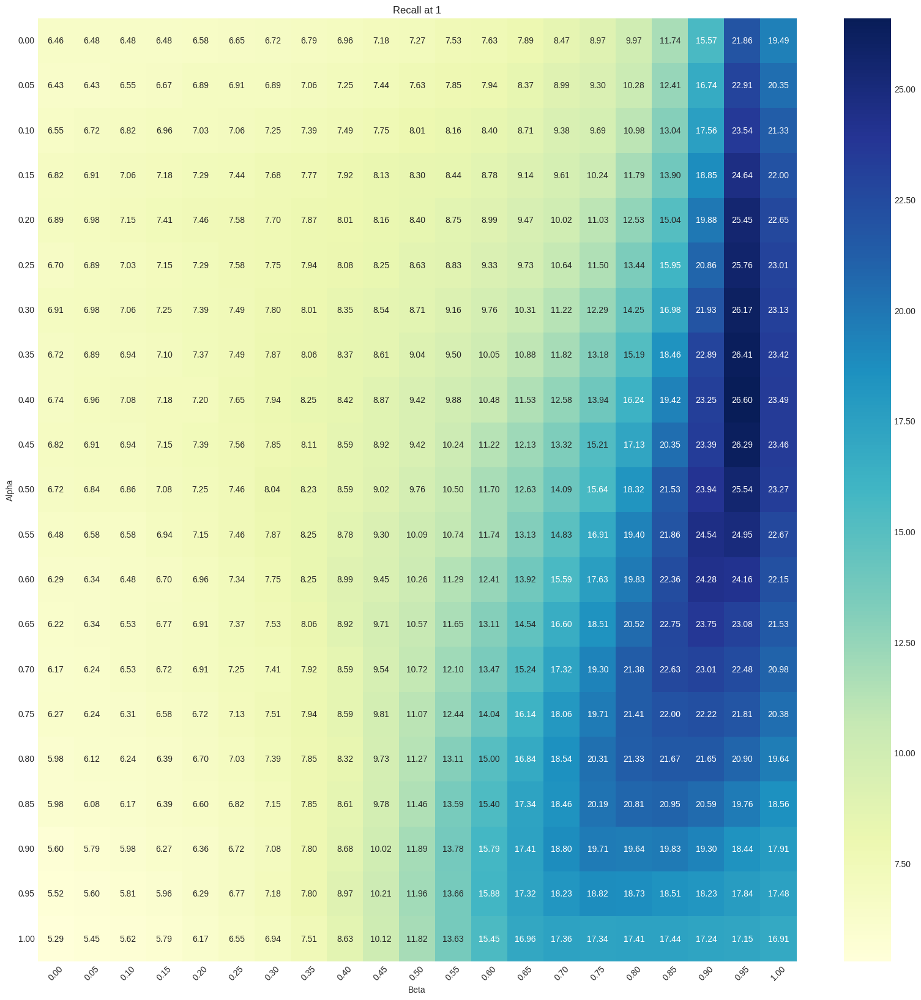

In [20]:
prepare_and_plot_recall_pivot(recall_at1, 'Recall at 1')

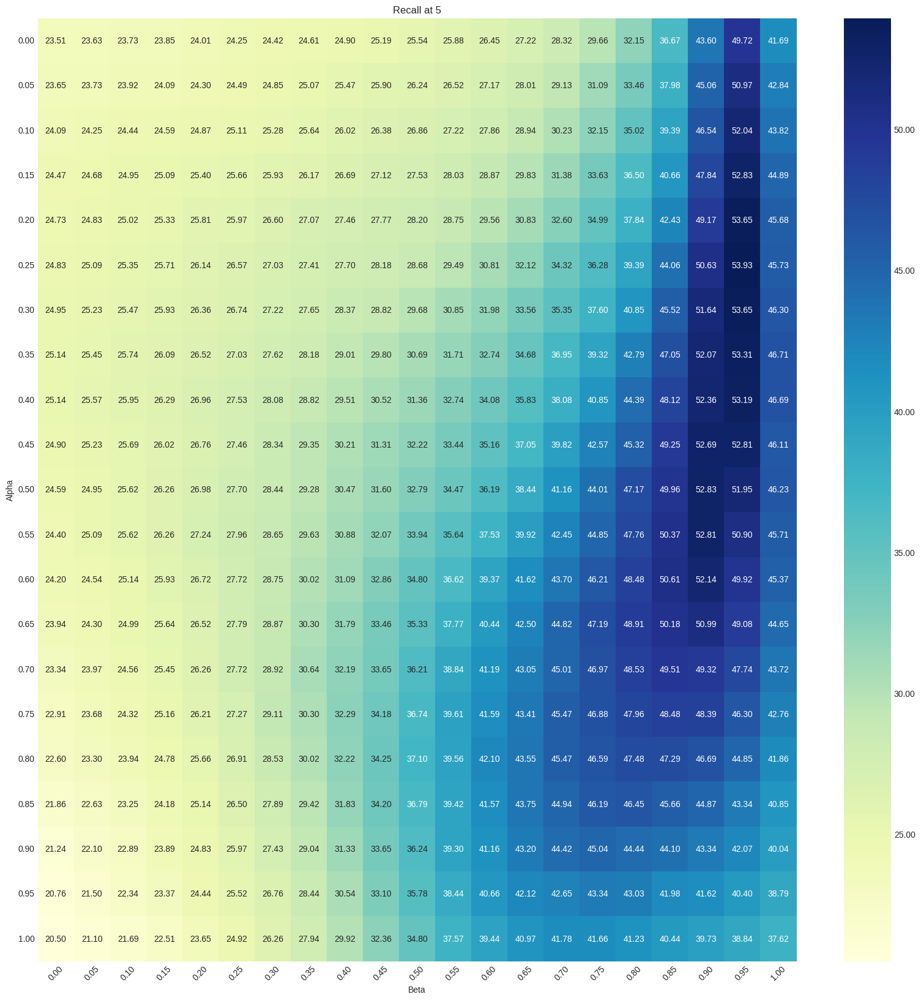

In [21]:
prepare_and_plot_recall_pivot(recall_at5, 'Recall at 5')

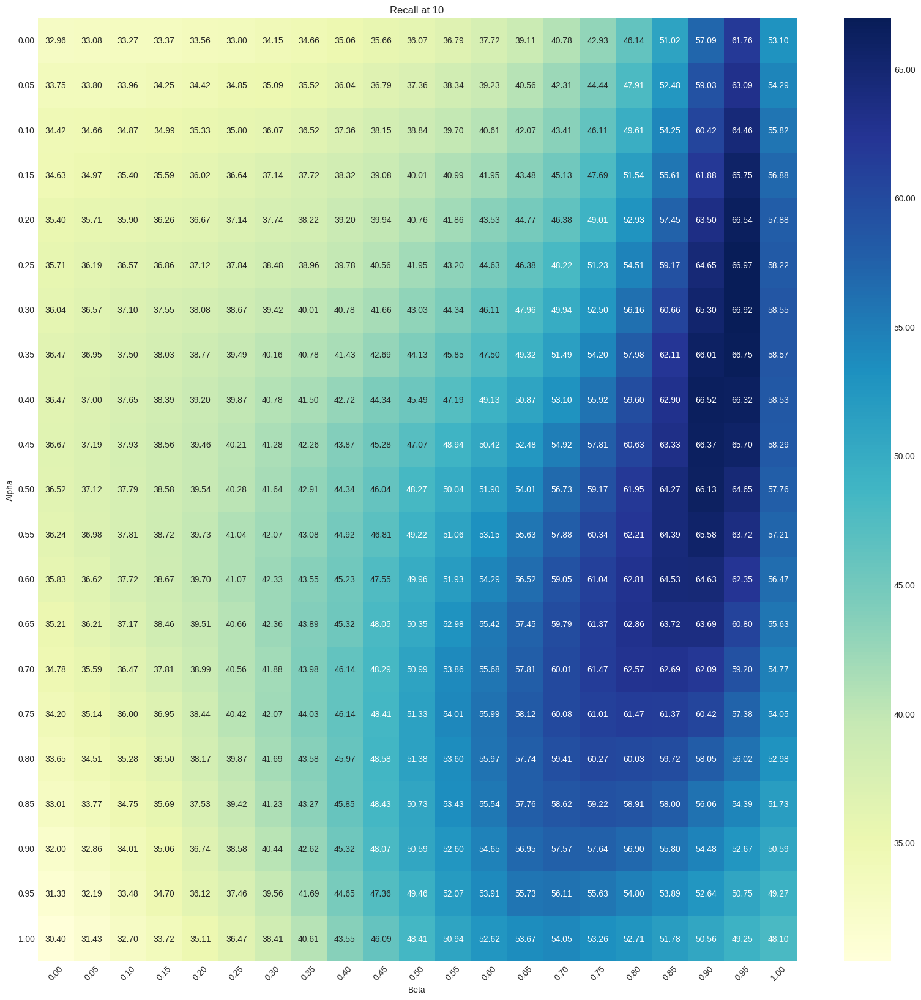

In [22]:
prepare_and_plot_recall_pivot(recall_at10, 'Recall at 10')

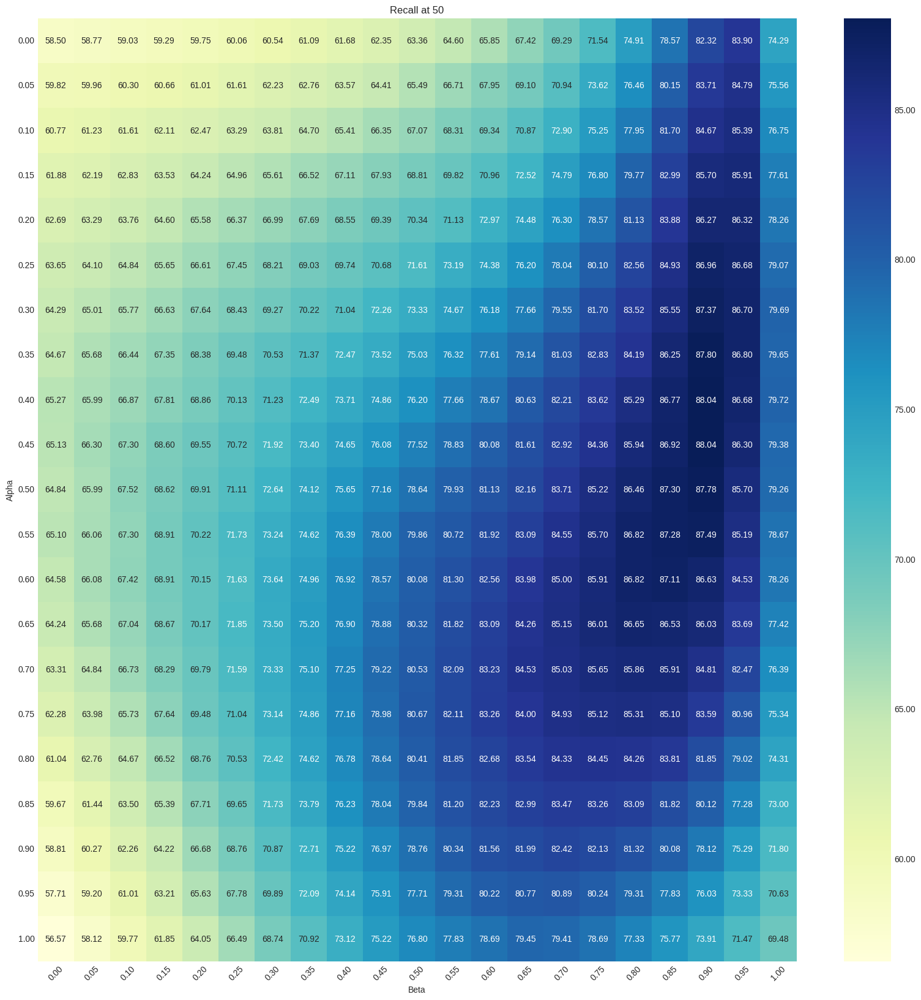

In [23]:
prepare_and_plot_recall_pivot(recall_at50, 'Recall at 50')

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the group recall results</div>

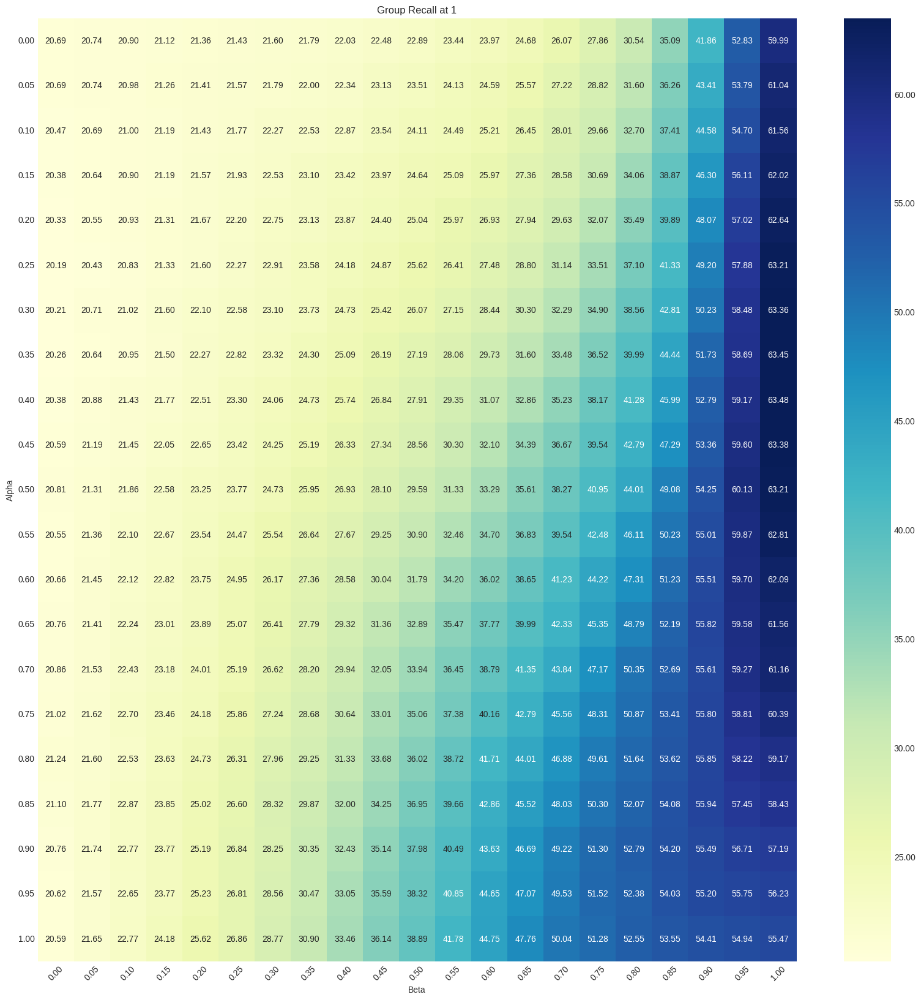

In [24]:
prepare_and_plot_recall_pivot(group_recall_at1, 'Group Recall at 1')

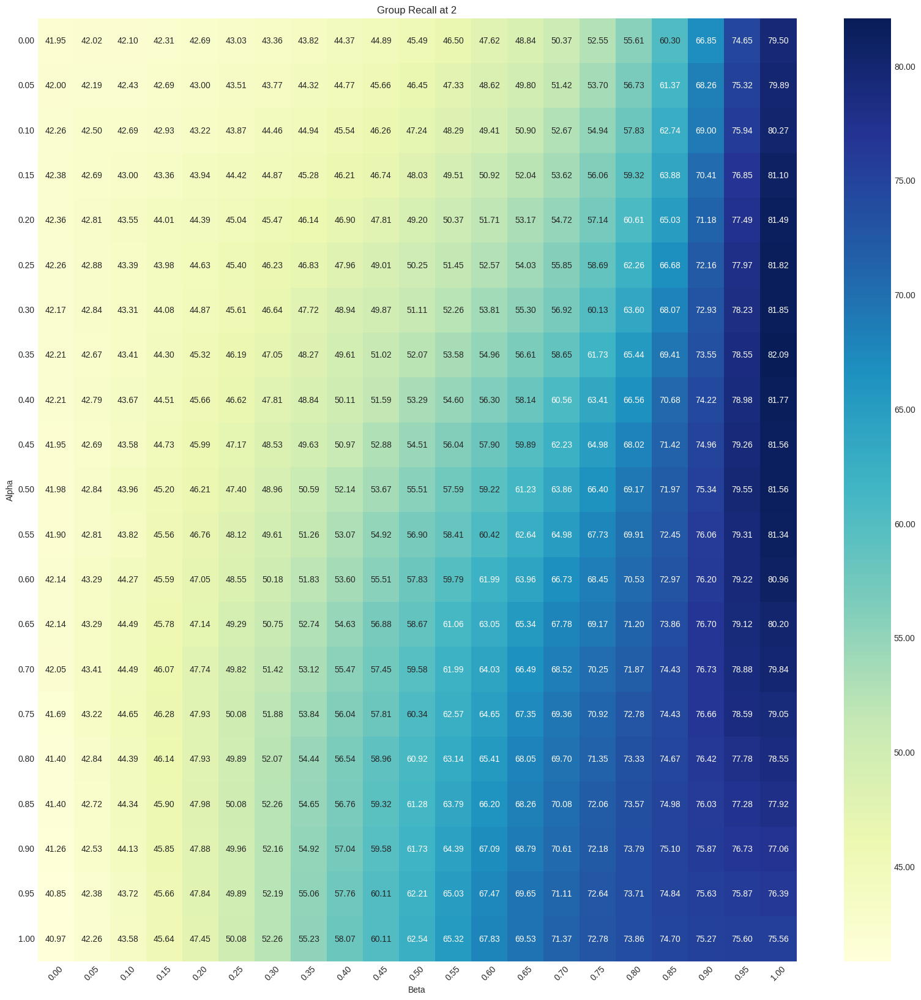

In [25]:
prepare_and_plot_recall_pivot(group_recall_at2, 'Group Recall at 2')

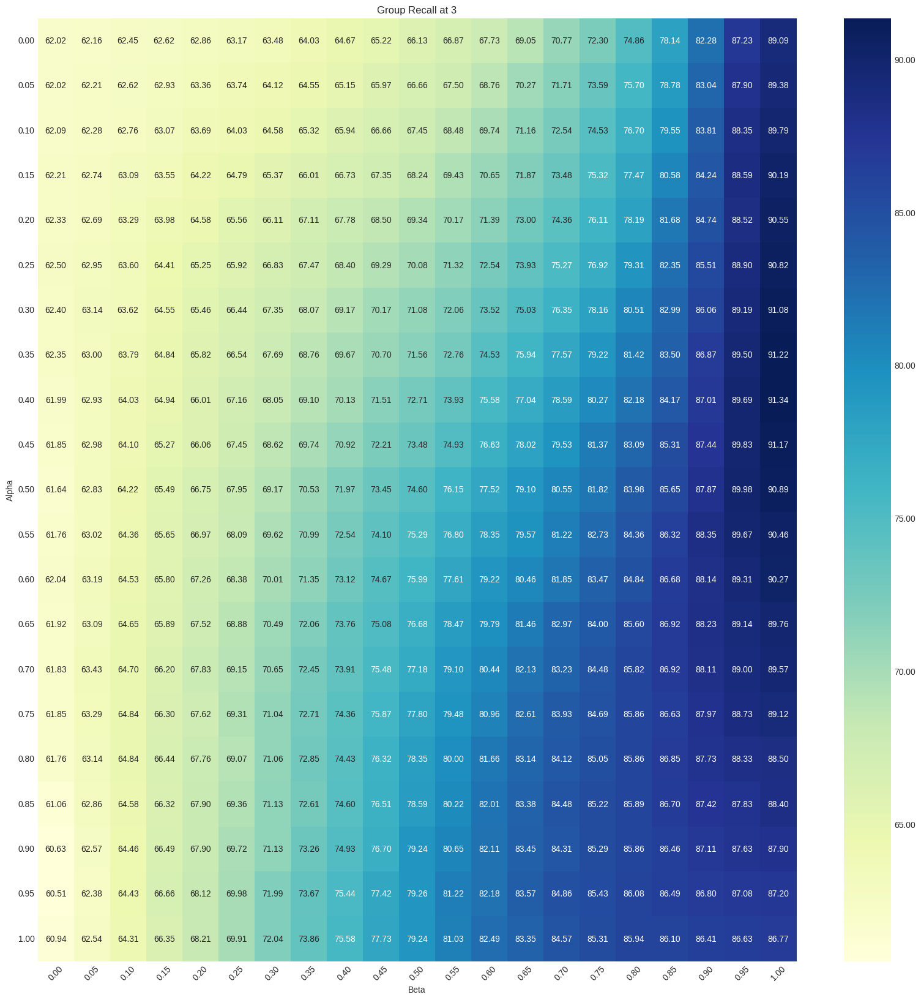

In [26]:
prepare_and_plot_recall_pivot(group_recall_at3, 'Group Recall at 3')

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 5: View some sample of the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the function to compute the results</div>

In [30]:
def compute_results(
    combining_function: callable,
    blip_text_encoder: torch.nn.Module,
    blip_img_encoder: torch.nn.Module,
    text_captions: List[dict],
    preprocess: callable,
    alpha: float = 0.65
) -> Tuple[torch.tensor, List[str], List[str]]:
    """
    View sample results on CIRR dataset combining text and image distances.
    
    :param combining_function:function which takes as input (image_features, text_features) and outputs the combined features
    :param blip_text_encoder: BLIP text model
    :param blip_img_encoder: BLIP image model
    :param text_captions: text captions for the CIRR dataset
    :param preprocess: preprocess pipeline
    :param alpha: alpha value for combining text and image distances
    
    :return: [(image_path, text_caption, candidate_image_paths)]
    """
    global cache
    blip_text_encoder = blip_text_encoder.float().eval()
    blip_img_encoder = blip_img_encoder.float().eval()

    if 'index_cache' not in cache:
        # Define the validation datasets and extract the index features
        classic_val_dataset = CIRRDataset('val', 'classic', preprocess)
    
        multiple_index_features, multiple_index_names = [], []
    
        for i in range(3):
            index_features, index_names, _ = extract_index_features_with_text_captions(
                classic_val_dataset,
                blip_text_encoder,
                text_captions,
                i + 1
            )
            multiple_index_features.append(index_features)
            multiple_index_names.append(index_names)
    
        image_index_features, image_index_names = extract_index_features(classic_val_dataset, blip_img_encoder)
        
        cache['index_cache'] = {
            "multiple_index_features": multiple_index_features,
            "multiple_index_names": multiple_index_names,
            "image_index_features": image_index_features,
            "image_index_names": image_index_names,
        }
    else:
        multiple_index_features = cache['index_cache']['multiple_index_features']
        multiple_index_names = cache['index_cache']['multiple_index_names']
        image_index_features = cache['index_cache']['image_index_features']
        image_index_names = cache['index_cache']['image_index_names']

    relative_val_dataset = CIRRDataset('val', 'relative', preprocess)

    all_text_distances = []
    reference_names = None
    target_names = None
    group_members = None

    # Compute distances for individual text features
    for text_features, text_names in zip(multiple_index_features, multiple_index_names):
        # Generate text predictions and normalize features
        predicted_text_features, reference_names, target_names, group_members = generate_cirr_val_predictions(
            blip_text_encoder,
            relative_val_dataset,
            combining_function,
            text_names,
            text_features
        )
        # Normalize features
        text_features = F.normalize(text_features, dim=-1)
        predicted_text_features = F.normalize(predicted_text_features, dim=-1)

        # Compute cosine similarity and convert to distance
        cosine_similarities = torch.mm(predicted_text_features, text_features.T)
        distances = 1 - cosine_similarities
        all_text_distances.append(distances)
        
    # Normalize and compute distances for image features if available
    if image_index_features is not None and len(image_index_features) > 0:
        predicted_image_features, _, _, _ = generate_cirr_val_predictions(
            blip_text_encoder,
            relative_val_dataset,
            combining_function,
            image_index_names,
            image_index_features
        )

        # Normalize and compute distances
        image_index_features = F.normalize(image_index_features, dim=-1).float()
        image_distances = 1 - predicted_image_features @ image_index_features.T
    else:
        image_distances = torch.zeros_like(all_text_distances[0])

    # Merge text distances
    merged_text_distances = torch.mean(torch.stack(all_text_distances), dim=0)

    # Merge text and image distances
    merged_distances = alpha * merged_text_distances + (1 - alpha) * image_distances

    # Sort the results
    sorted_indices = torch.argsort(merged_distances, dim=-1).cpu()
    sorted_index_names = np.array(
        image_index_names if image_index_names else multiple_index_names[0]
    )[sorted_indices]

    # Delete the reference image from the results
    reference_mask = torch.tensor(
        sorted_index_names != np.repeat(
            np.array(reference_names),
            len(image_index_names)
        ).reshape(len(target_names), -1)
    )

    sorted_index_names = sorted_index_names[reference_mask].reshape(
        sorted_index_names.shape[0],
        sorted_index_names.shape[1] - 1
    )

    # Compute the ground-truth labels with respect to the predictions
    labels = torch.tensor(
        sorted_index_names == np.repeat(
            np.array(target_names),
            len(sorted_index_names[0])
        ).reshape(len(target_names), -1)
    )

    # Compute the subset predictions and ground-truth labels
    group_members = np.array(group_members)
    group_mask = (sorted_index_names[..., None] == group_members[:, None, :]).sum(-1).astype(bool)
    group_labels = labels[group_mask].reshape(labels.shape[0], -1)

    assert torch.equal(torch.sum(labels, dim=-1).int(), torch.ones(len(target_names)).int())
    assert torch.equal(torch.sum(group_labels, dim=-1).int(), torch.ones(len(target_names)).int())

    # Compute the metrics
    recall_at1 = (torch.sum(labels[:, :1]) / len(labels)).item() * 100
    recall_at5 = (torch.sum(labels[:, :5]) / len(labels)).item() * 100
    recall_at10 = (torch.sum(labels[:, :10]) / len(labels)).item() * 100
    recall_at50 = (torch.sum(labels[:, :50]) / len(labels)).item() * 100
    group_recall_at1 = (torch.sum(group_labels[:, :1]) / len(group_labels)).item() * 100
    group_recall_at2 = (torch.sum(group_labels[:, :2]) / len(group_labels)).item() * 100
    group_recall_at3 = (torch.sum(group_labels[:, :3]) / len(group_labels)).item() * 100
    print(f"Recall Results\nRecall at 1: {recall_at1:.2f}\nRecall at 5: {recall_at5:.2f}\nRecall at 10: {recall_at10:.2f}\nRecall at 50: {recall_at50:.2f}")
    print(f"Group Recall Results\nGroup Recall at 1: {group_recall_at1:.2f}\nGroup Recall at 2: {group_recall_at2:.2f}\nGroup Recall at 3: {group_recall_at3:.2f}")

    return sorted_indices, image_index_names, target_names

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results</div>

In [76]:
sorted_indices, image_index_names, target_names = compute_results(
    get_combing_function_with_beta(0.95),
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    alpha=0.4
)

CIRR val dataset in relative mode initialized


100%|██████████| 131/131 [00:02<00:00, 63.57it/s]


Recall Results
Recall at 1: 26.60
Recall at 5: 53.19
Recall at 10: 66.32
Recall at 50: 86.68

Group Recall Results
Group Recall at 1: 59.17
Group Recall at 2: 78.98
Group Recall at 3: 89.69

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Prepare the ground truth data</div>

In [77]:
def prepare_ground_truths(json_data):
    """
    Prepare ground truth data from the JSON structure.
    
    :param json_data: JSON data containing target and candidate matches with captions
    :return: Dictionary mapping targets to lists of tuples (candidates and captions)
    """
    ground_truths = {}
    for entry in json_data:
        target_hard = entry['target_hard']
        reference = entry['reference']
        caption = entry['caption']
        img_set = entry['img_set']
        if target_hard not in ground_truths:
            ground_truths[target_hard] = []
        ground_truths[target_hard].append((reference, caption, img_set))
    return ground_truths

 ## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the retrieval results for a query</div>

In [78]:
def plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truths, top_k=5, i=0):
    """
    Plot retrieval results for a specific query showing the query and its top retrieved images, highlighting ground truths
    and displaying associated captions to the left of the query image.

    :param sorted_indices: 2D tensor or array with sorted indices of retrieved images per query.
    :param image_index_names: List of image paths corresponding to indices in sorted_indices.
    :param target_names: List of names or descriptions for each query.
    :param ground_truths: Dictionary mapping target names to lists of tuples (candidates and captions).
    :param top_k: Number of top retrieved results to display per query.
    :param i: Index of the query to display.
    """
    query_index = i
    retrival_result_images = [image_index_names[j] for j in sorted_indices[query_index]][:top_k]
    ground_truth_target = target_names[query_index]
    query_img_path, query_caption, img_set = ground_truths.get(ground_truth_target, [('', '', '')])[0]

    fig = plt.figure(figsize=(30, 5))
    gs = GridSpec(2, top_k + 2, figure=fig)
    query_img = Image.open(f'../cirr_dataset/dev/{query_img_path}.png')

    # Subplot for the caption text to the left of the query image
    ax_text = fig.add_subplot(gs[0, 0])
    query_name = query_img_path
    ax_text.text(0.5, 0.5, query_caption, va='center', ha='center')
    ax_text.axis('off')

    # Subplot for the query image
    ax_image = fig.add_subplot(gs[0, 1])
    ax_image.imshow(query_img)
    ax_image.set_title(f"Query: {query_name}", color='blue')
    ax_image.axis('off')

    for j, img_path in enumerate(retrival_result_images):
        img = Image.open(f'../cirr_dataset/dev/{img_path}.png')

        ax_result = fig.add_subplot(gs[0, j + 2])
        ax_result.imshow(img)

        # Check if this image is a ground truth and retrieve its captions
        if img_path == ground_truth_target:
            ax_result.set_title(f"{img_path}", color='green')
        else:
            ax_result.set_title(img_path)

        ax_result.axis('off')
        
    # Subplot for the group members in second row
    img_set_members = img_set['members'] # Array of image paths

    # Subplot for the caption text to the left of the query image
    ax_text = fig.add_subplot(gs[1, 0])
    query_name = query_img_path
    ax_text.text(0.5, 0.5, query_caption, va='center', ha='center')
    ax_text.axis('off')
    
    # Subplot for the query image
    ax_image = fig.add_subplot(gs[1, 1])
    ax_image.imshow(query_img)
    ax_image.set_title(f"Query: {query_name}", color='blue')
    ax_image.axis('off')
    
    for j, img_path in enumerate(img_set_members):
        img = Image.open(f'../cirr_dataset/dev/{img_path}.png')

        ax_result = fig.add_subplot(gs[1, j + 2])
        ax_result.imshow(img)

        # Check if this image is a ground truth and retrieve its captions
        if img_path == ground_truth_target:
            ax_result.set_title(f"{img_path}", color='green')
        else:
            ax_result.set_title(img_path)

        ax_result.axis('off')

    plt.tight_layout()
    plt.show()

In [79]:
ground_truth = prepare_ground_truths(json.load(open('../cirr_dataset/cirr/captions/cap.rc2.val.json')))

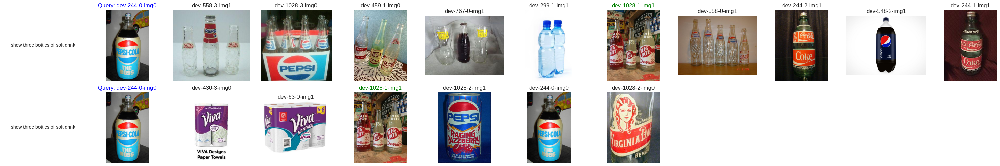

In [80]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=0)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 6: Compare with alpha=0 (Same as the original BLIP4CIR)</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results with alpha=0</div>

In [81]:
sorted_indices_origin, image_index_names_origin, target_names_origin = compute_results(
    combining_function_original,
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    alpha=0
)

CIRR val dataset in relative mode initialized


100%|██████████| 131/131 [00:02<00:00, 63.65it/s]


Recall Results
Recall at 1: 7.27
Recall at 5: 25.54
Recall at 10: 36.07
Recall at 50: 63.36

Group Recall Results
Group Recall at 1: 22.89
Group Recall at 2: 45.49
Group Recall at 3: 66.13

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results</div>

In [82]:
def found_better_than_original(
        sorted_indices_origin, image_index_names_origin, target_names_origin,
        sorted_indices, image_index_names, target_names, top_k=10
) -> List[int]:
    """
    Return indices of queries where the new retrieval results are better than the original results based on the rank
    of the ground truth in the top_k results.

    Args:
        sorted_indices_origin (np.ndarray): 2D array of sorted indices by relevance per query for the original method.
        image_index_names_origin (List[str]): List of image names corresponding to indices in sorted_indices_origin.
        target_names_origin (List[str]): List of names or descriptions for each query for the original method.
        sorted_indices (np.ndarray): 2D array of sorted indices by relevance per query for the new method.
        image_index_names (List[str]): List of image names corresponding to indices in sorted_indices.
        target_names (List[str]): List of target names each query is supposed to retrieve.
        top_k (int): Number of top retrieved results to consider per query.

    Returns:
        List[int]: List of indices where the new method outperforms the original method in terms of the rank of the
        ground truth target.
    """
    better_indices = []
    total_queries = len(target_names)  # Assuming the same number of queries for both sets

    for index in range(total_queries):
        # Find the index of the ground truth in the top_k results of the original method
        new_rank = [image_index_names[i] for i in sorted_indices[index]].index(target_names[index])
        origin_rank = [image_index_names_origin[i] for i in sorted_indices_origin[index]].index(target_names_origin[index])

        if new_rank <= top_k < origin_rank:
            better_indices.append(index)

    return better_indices

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results for the Dress category</div>

In [83]:
become_better = found_better_than_original(
    sorted_indices_origin, image_index_names_origin, target_names_origin,
    sorted_indices, image_index_names, target_names,
    top_k=10
)

len(become_better), become_better[:10]

(1521, [0, 6, 14, 15, 19, 29, 30, 34, 45, 52])

In [84]:
become_worse = found_better_than_original(
    sorted_indices, image_index_names, target_names,
    sorted_indices_origin, image_index_names_origin, target_names_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(245, [4, 22, 24, 31, 66, 98, 106, 150, 152, 183])

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 7: Visualize the comparison</div>

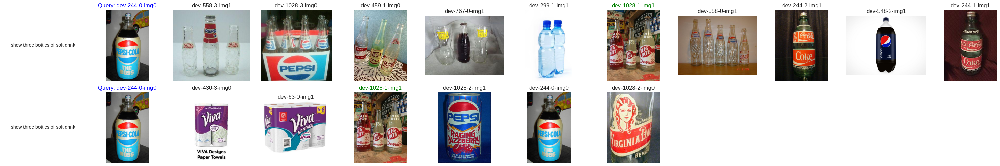

In [85]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=0)

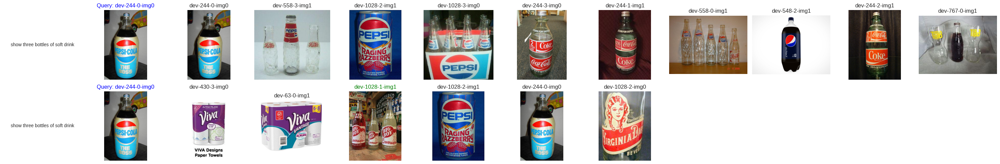

In [86]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=0)

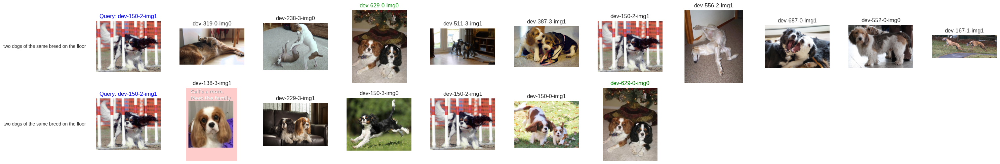

In [87]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=6)

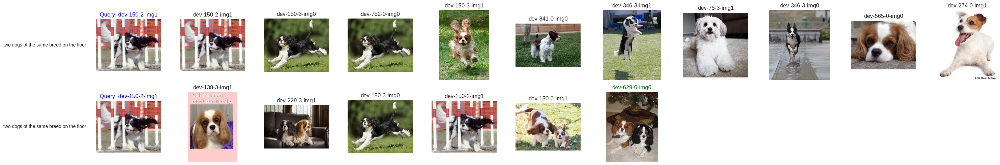

In [88]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=6)

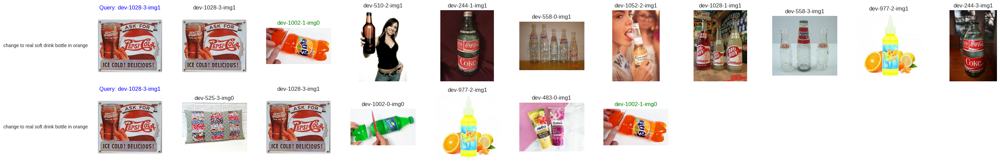

In [96]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=19)

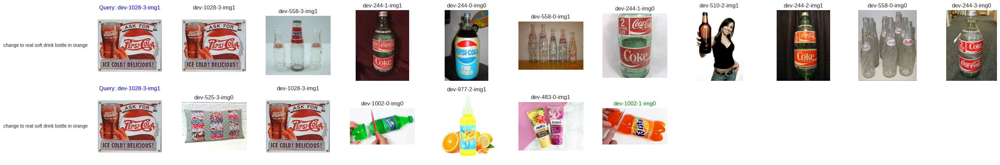

In [95]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=19)